### Table of Contents

* [I.Titles](#I.-Titles)
    * [1. Percentage of full-uppercase titles](#1.-Percentage-of-full-uppercase-titles)
    * [2. Most common words in video titles](#2.-Most-common-words-in-video-titles)
    * [3. Most common symbols in video titles](#3.-Most-common-symbols-in-video-titles)
    * [4. Most common emojis in video titles](#4.-Most-common-emojis-in-video-titles)
    * [5. Most common bigrams in video titles](#5.-Most-common-bigrams-in-video-titles)
    * [6. Are hashtags used in video titles?](#6.-Are-hashtags-used-in-video-titles?)
    * [7. Best title length](#7.-Best-title-length)
* [II.Categories](#II.-Categories)
    * [8. Percentage trending per categories](#8.-Percentage-trending-per-categories)
* [III.Publish Day](#III.-Publish-Day)
    * [9. Most Popular Publishing Day for Trending Videos](#9.-Most-Popular-Publishing-Day-for-Trending-Videos)
* [IV.Channels](#IV.-Channels)
    * [10. Most Popular Channel for Trending Videos](#10.-Most-Popular-Channel-for-Trending-Videos)
* [V.Comments](#V.-Comments)
    * [11. Comment count distribution](#11.-Comment-count-distribution)
* [VI.Descriptions](#VI.-Descriptions)
    * [12. Distribution of description lengths](#12.-Distribution-of-description-lengths)
    * [13. Most common words in descriptions](#13.-Most-common-words-in-descriptions)
    * [14. Most common bigrams in descriptions](#14.-Most-common-2-grams-in-descriptions)
    * [15. Are hashtags used in video descriptions?](#15.-Are-hashtags-used-in-video-descriptions?)
* [VII.Tags](#VII.-Tags)
    * [16. Distribution of the number and length of tags](#16.-Distribution-of-the-number-and-length-of-tags)
    * [17. Most common words in tags](#17.-Most-common-words-in-tags)
    * [18. Are hashtags used in video tags?](#18.-Are-hashtags-used-in-video-tags?)
* [VIII.All](#VIII.-All)
    * [19. Correlations of Trending Videos](#19.-Correlations-of-Trending-Videos)

# Libraries and Data Loading

In [1]:
import pyspark 
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()

In [2]:
import pandas as pd
from pyspark.sql.types import ArrayType, StructField, StructType, StringType, IntegerType, DecimalType, TimestampType
from decimal import Decimal
import pyspark
from pyspark import SparkContext
from pyspark import SparkConf

import numpy as np
import os
import requests
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import ticker
from matplotlib import cm 
import matplotlib.colors as mc
import seaborn as sns
from IPython.display import HTML
import re
from collections import Counter
import wordcloud
from pprint import pprint
import random
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from nltk.util import ngrams
from nltk import download as nltk_download
from PIL import Image
import emoji
import tempfile
import io
from PIL import Image
import time
from scipy.spatial import distance
from skimage import color as skcolor
import seaborn as sns

from subprocess import check_output
import re, string
from operator import add

In [3]:
def plot_conf(ax, xlbl='', ylbl='', t='', back_color='#ffffff',
              text_color='#616161', grid_color='#e9e9e9', 
              tick_color='', ticklbl_size=9, lbl_size=11, lang='en'):
    """
    This function perform operations to produce better-looking 
    visualizations
    """
    # changing the background color of the plot
    ax.set_facecolor(back_color)
    # modifying the ticks on plot axes
    ax.tick_params(axis='both', labelcolor=text_color, color=back_color)
    if tick_color != '':
        ax.tick_params(axis='both', color=tick_color)
    ax.tick_params(axis='both', which='major', labelsize=ticklbl_size)
    # adding a grid and specifying its color
    ax.grid(True, color=grid_color)
    # making the grid appear behind the graph elements
    ax.set_axisbelow(True)
    # hiding axes
    ax.spines['bottom'].set_color(back_color)
    ax.spines['top'].set_color(back_color) 
    ax.spines['right'].set_color(back_color)
    ax.spines['left'].set_color(back_color)
    # setting the title, x label, and y label of the plot
    if lang == 'ar':
        ax.set_title(get_display(reshaper.reshape(t)), fontweight='bold', family='Amiri',
                     fontsize=14, color=text_color, loc='right', pad=24);
        ax.set_xlabel(get_display(reshaper.reshape(xlbl)), fontweight='bold', family='Amiri',
                      labelpad=16, fontsize=lbl_size, color=text_color, fontstyle='italic');
        ax.set_ylabel(get_display(reshaper.reshape(ylbl)), fontweight='bold', family='Amiri',
                      color=text_color, labelpad=16, fontsize=lbl_size, fontstyle='italic');
    else:
        ax.set_title(t, fontsize=14, color='#616161', loc='left', pad=24, fontweight='bold');
        ax.set_xlabel(xlbl, labelpad=16, fontsize=lbl_size, color='#616161', fontstyle='italic');
        ax.set_ylabel(ylbl, color='#616161', labelpad=16, fontsize=lbl_size, fontstyle='italic');
        
        
def change_width(ax, new_value) :
    for patch in ax.patches :
        current_width = patch.get_width()
        diff = current_width - new_value

        # we change the bar width
        patch.set_width(new_value)

        # we recenter the bar
        patch.set_x(patch.get_x() + diff * .5)
        
def change_height(ax, new_value) :
    for patch in ax.patches :
        current_height = patch.get_height()
        diff = current_height - new_value

        # we change the bar width
        patch.set_height(new_value)

        # we recenter the bar
        patch.set_y(patch.get_y() + diff * .5)
        
        
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
pd.set_option('display.max_colwidth', None)

def highlight_max(s):
    return ['background-color: rgba(255, 69, 00, {})'.format(x/s.max()) if (x/s.max()) > 0.1 else 'background-color: rgba(255, 69, 00, 0.1)' for x in s]

styles = [
    dict(selector="td, th", props=[("border", "0px solid #333"), ("padding", "6px"), ("max-width", "200px")]),
#     dict(selector="th.col_heading", props=[("background", "#ff0000"), ("color", "#b58900"), ("padding", "10px 16px")]),
    dict(selector="th.row_heading", props=[("background", "#E32400"), ("color", "white"), ("text-align", "left")]),
    dict(selector="tr:nth-child(even)", props=[("background", "#EFEFEF")]),
    dict(selector="tr:nth-child(odd)", props=[("background", "#ffffff")]),
    dict(selector=".col_heading", props=[("display", "none")]),
    dict(selector=".blank.level0", props=[("display", "none")]),

]

# For word clouds
WC_MAX_FZ = 400 
WC_RS = 0.5

THEME_COL = '#e03531'

def rgb2lab ( inputColor ) :
    
    num = 0
    RGB = [0, 0, 0]

    for value in inputColor :
        value = float(value) / 255

        if value > 0.04045 :
            value = ( ( value + 0.055 ) / 1.055 ) ** 2.4
        else :
            value = value / 12.92

        RGB[num] = value * 100
        num = num + 1

    XYZ = [0, 0, 0,]

    X = RGB [0] * 0.4124 + RGB [1] * 0.3576 + RGB [2] * 0.1805
    Y = RGB [0] * 0.2126 + RGB [1] * 0.7152 + RGB [2] * 0.0722
    Z = RGB [0] * 0.0193 + RGB [1] * 0.1192 + RGB [2] * 0.9505
    XYZ[ 0 ] = round( X, 4 )
    XYZ[ 1 ] = round( Y, 4 )
    XYZ[ 2 ] = round( Z, 4 )

    XYZ[ 0 ] = float( XYZ[ 0 ] ) / 95.047         # ref_X =  95.047   Observer= 2°, Illuminant= D65
    XYZ[ 1 ] = float( XYZ[ 1 ] ) / 100.0          # ref_Y = 100.000
    XYZ[ 2 ] = float( XYZ[ 2 ] ) / 108.883        # ref_Z = 108.883

    num = 0
    for value in XYZ :

        if value > 0.008856 :
            value = value ** ( 0.3333333333333333 )
        else :
            value = ( 7.787 * value ) + ( 16 / 116 )

        XYZ[num] = value
        num = num + 1

    Lab = [0, 0, 0]

    L = ( 116 * XYZ[ 1 ] ) - 16
    a = 500 * ( XYZ[ 0 ] - XYZ[ 1 ] )
    b = 200 * ( XYZ[ 1 ] - XYZ[ 2 ] )

    Lab [ 0 ] = round( L, 4 )
    Lab [ 1 ] = round( a, 4 )
    Lab [ 2 ] = round( b, 4 )

    return Lab

We loaded all csv file after processed by spark.

In [4]:
#df=spark.read.csv('hdfs://seneca1.lehre.hwr-berlin.de:8020/user/erik_eberhardt/yt_sample/*.csv').collect()
data = spark.read.format("csv").option("header", True).option("multiLine", True).option("inferSchema", True).load("youtube/Trending_Videos_Erik/*.csv")
data.show()

+-----------+--------------------+-------------------+--------------------+------------------+----------+-------------+--------------------+----------+------+--------+-------------+--------------------+-----------------+----------------+--------------------+----------------+-------+
|   video_id|               title|        publishedAt|           channelId|      channelTitle|categoryId|trending_date|                tags|view_count| likes|dislikes|comment_count|      thumbnail_link|comments_disabled|ratings_disabled|         description|   category_name|country|
+-----------+--------------------+-------------------+--------------------+------------------+----------+-------------+--------------------+----------+------+--------+-------------+--------------------+-----------------+----------------+--------------------+----------------+-------+
|AjhlUT-IiMY|HIGHLIGHTS ARGENT...|2021-07-04 05:43:30|UCcDhPsZnQKMn_4Df...|      Copa América|        17|     21.04.07|Copaamerica|copa ...|   40862

In [5]:
df=data.toPandas()
df

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name,country
0,AjhlUT-IiMY,HIGHLIGHTS ARGENTINA 3 - 0 ECUADOR | COPA AMÉRICA 2021 | 03-07-21,2021-07-04 05:43:30,UCcDhPsZnQKMn_4DfDBuYg1Q,Copa América,17,21.04.07,Copaamerica|copa america|copa america brasil|juegos de copa america|jogos da copa america|mejores momentos copa america|melhores momentos copa america|copa america no youtube|copa america en youtube|copa america en vivo|copa america ao vivo|partidas copa america|partidos copa america|conmebol copa america|copaamerica 2021|copa america 2021,4086242,91453,2046,7091,https://i.ytimg.com/vi/AjhlUT-IiMY/default.jpg,False,False,"Fecha: 03 de julio de 2021Estadio: Olímpico Pedro LudovicoMira los mejores momentos del partido de Argentina y Ecuador en la CONMEBOL Copa América 2021, por los cuartos de final.Suscríbete en nuestro canal: http://bit.ly/copaAmericASiga las otras redes sociales de CONMEBOL Copa América.Facebook: https://www.facebook.com/CopaAmericaInstagram: https://www.instagram.com/copaamerica/Twitter: https://twitter.com/CopaAmerica",Sports,GB
1,I5XC1swFQTE,Highlights: England thrash Ukraine to make last four | UEFA Euro 2020,2021-07-03 23:09:17,UCW6-BQWFA70Dyyc7ZpZ9Xlg,BBC Sport,17,21.04.07,BBC|BBC Sport|football|Match of the Day|MOTD|Highlights|Match highlights|football highlights|euro 2020 highlights|euro 2020|bbc highlights|euros highlights|uefa euro 2020|euros 2020|euro 2021|euros tv highlights|euros|England|harry kane|sterling|Ukraine|Gareth Southgate|Raheem Sterling|Luke Shaw|Harry Maguire|Maguire header|Sancho|Sterling skill|Denmark|quarter-final|Rome|harry kane brace,720147,14517,289,3729,https://i.ytimg.com/vi/I5XC1swFQTE/default.jpg,False,False,England produce a magnificent display as they thrash Ukraine in Rome to set up a Euro 2020 semi-final against Denmark at Wembley. \r\r=============\r\rSUBSCRIBE so you never miss out on our best videos\r➡️➡️http://bit.ly/1sFodyu \r\rUploads every Monday - Wednesday - Friday.\r\r=============\r\rFind us here: \r\rBBC Sport: http://www.bbc.co.uk/sport \rFacebook: https://www.facebook.com/BBCSport/ \rTwitter: https://twitter.com/BBCSport \rInstagram: https://www.instagram.com/bbcsport/\r\r#bbcsport #Euro2020 #England\rHighlights: England thrash Ukraine to make last four | UEFA Euro 2020,Sports,GB
2,rer6N3vhZbk,VARANE TERMS AGREED! Man Utd Transfer News,2021-07-04 12:18:50,UCMmVPVb0BwSIOWVeDwlPocQ,The United Stand,24,21.04.07,Manchester United|Man United|Man Utd|Manchester United TV|The United Stand|United Stand|Manchester United News|MUFC|Man Utd News|United|Manchester United Latest News|Manchester United Transfer News|Transfer|Solskjaer|Ole Gunnar Solskjaer|Solskjaer news|Solskjaer press conference|Ole Gunnar Solskjaer Press Conference|Bruno Fernandes|Eduardo Camavinga|Camavinga|Camavinga transfer|Sancho|Jadon Sancho|Sancho transfer|Varane|raphael varane|Varane man utd,169834,7270,197,689,https://i.ytimg.com/vi/rer6N3vhZbk/default.jpg,False,False,"Man Utd agree personal terms with Raphael Varane as PSG prepare a move for Paul Pogba according to the latest transfer reports . GET YOUR United Stand Exclusive T Shirt HERE https://united-stand.myshopify.com/products/jadon-welcome-to-manchester-tee🚨VISIT OUR WEBSITE 🚨For all the latest United news and TUS content:https://www.theunitedstand.com​​​​⏲️The United Stand Content TIMELINE is the best way to find all our latest content quickly! https://www.theunitedstand.com/timeli...​📰 LATEST WRITTEN NEWS https://www.theunitedstand.com/articl...​📸 FOLLOW OUR INSTAGRAMhttps://www.instagram.com/theunitedst...​✅ The United Stand MEMBERSHIP https://buff.ly/2I2Of9R​​​​📧Contact The United Stand = soccerboxtv@gmail.com📧WRITER SUBMISSIONS = unitedstandwebsite@gmail.comAddressing: Jamie or NoraSee the FULL United Stand Kit Range CLICK HERE https://buff.ly/2Krpw1z​​​​EXCLUSIVE NEW PODCAST ITUNES ht

In [6]:
#DF1 = Drop duplicate video_id
df1=df.sort_values(by=['trending_date','view_count'],ascending=False).drop_duplicates(subset=['video_id'])
df1

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name,country
17818,7yUqQULy318,This isn't David Copperfield Magic trick😂 #shorts by Tsuriki Show,2021-06-20 06:55:00,UCymK_3BWUcoYVVf5D_GmACQ,Tsuriki Show,23,21.08.07,tsurikishow|vova|anya|vovanya|magic|trick|magic trick|devid copperfield,207807913,5329260,203040,19907,https://i.ytimg.com/vi/7yUqQULy318/default.jpg,False,False,Thank you for watching.Subscribe to Tsuriki Show!More of our videos on Instagram https://instagram.com/twiceofniceAnd a huge number of Short videos with Vova and Anya in our Tik Tok https://vm.tiktok.com/ZMeke4LVv/#tsurikishow #tiktok #vovanya,Comedy,IE
17359,uTQnMukAhsg,When the cheating went wrong #Shorts,2021-06-25 02:56:11,UCt8z2S30Wl-GQEluFVM8NUw,Fortnite Fun TV,24,21.08.07,[none],137842114,3954781,115743,3609,https://i.ytimg.com/vi/uTQnMukAhsg/default.jpg,False,False,"When the cheating went wrong #ShortsHey guys! Watch my new video: When the cheating went wrong #ShortsEnjoy the video, share your comments, support by likes and subscribe! Turn on your notifications to keep up of all my new videos :)#Shorts",Entertainment,AU
17280,PRz64kSEJqs,She is foxy but not enough #Shorts,2021-06-29 02:47:43,UCt8z2S30Wl-GQEluFVM8NUw,Fortnite Fun TV,24,21.08.07,[none],126907932,4195699,139668,2660,https://i.ytimg.com/vi/PRz64kSEJqs/default.jpg,False,False,"She is foxy but not enough #ShortsHey guys! Watch my new video: She is foxy but not enough #ShortsEnjoy the video, share your comments, support by likes and subscribe! Turn on your notifications to keep up of all my new videos :)#Shorts",Entertainment,AU
17811,eHmLgbTHEoY,Guess the sound challenge🎵 #shorts by Tsuriki Show,2021-06-22 06:00:08,UCymK_3BWUcoYVVf5D_GmACQ,Tsuriki Show,23,21.08.07,tsuriki show|vova|anya|vovanya|tiktok compilation|best tiktok video|funny video|joke|challenge|new challenge|humor,123465434,3533669,161774,4600,https://i.ytimg.com/vi/eHmLgbTHEoY/default.jpg,False,False,Thank you for watching.Subscribe to Tsuriki Show!More of our videos on Instagram https://instagram.com/twiceofniceAnd a huge number of Short videos with Vova and Anya in our Tik Tok https://vm.tiktok.com/ZMeke4LVv/#tsurikishow #tiktok #vovanya,Comedy,IE
17363,ZAdOy2JagxM,A STORY ABOUT GREED 💸,2021-06-27 04:00:12,UC5gxP-2QqIh_09djvlm9Xcg,Alan Chikin Chow,23,21.08.07,alan chikin chow|tiktok|superhero fanfics be like|wattpad stories|wattpad|fanfics|korea.on|on oppa|sci fi fan fics be like|sci-fi fanfics be like|how cryptocurrency works|cryptocurrency tips|cryptocurrency humor|funny bitcoin stories|how bitcoin works|best tips for cryptocurrency trading|cryptocurrency for beginners|alan chikin chow cryptocurrency|alan chikin chow tiktok|if your phone could see the future|how to get rich quick|get rich quick story,84769369,3254219,153897,7821,https://i.ytimg.com/vi/ZAdOy2JagxM/default.jpg,False,False,"Hey Alan Army! This video is called A Story About Greed. What lesson did you learn? With @Steven Dux Steven is a real life multimillionaire! Check out Steven Dux's finance course here: https://www.stevenduxi.com/freedom-challenge/Q&A WITH STEVEN (Real Life Multimillionaire) ➡️ https://youtu.be/SCZLDoJ-l98#ShortsFollow me on IG for your daily dose of Chikin 🐥IG: https://www.instagram.com/alanchikinchow/Subscribe and I'll love you forever ♡🔥 WHO AM I 🔥Hey friends, I'm Alan Chikin Chow!!I'm a creator, actor & writer. My mission is to inspire people of all backgrounds and identities to unite through laughter. 🤍#AlanArmy",Comedy,AU
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9198,KslXveK-qw8,Chris Whitty: Police investigate video of Chief Medical Officer being harassed by two men,2021-06-29 08:24:55,UCPgLNge0xqQHWM5B5EFH9Cg,The Telegraph,17,21.04.07,Telegraph|News|uk news|chris|whitty|chris whitty uk|harrassed|london|st james park|video|footage|social media|instagram|ch

In [7]:
df1.head(1).transpose()

,17818
video_id,7yUqQULy318
title,This isn't David Copperfield Magic trick😂 #shorts by Tsuriki Show
publishedAt,2021-06-20 06:55:00
channelId,UCymK_3BWUcoYVVf5D_GmACQ
channelTitle,Tsuriki Show
categoryId,23
trending_date,21.08.07
tags,tsurikishow|vova|anya|vovanya|magic|trick|magic trick|devid copperfield
view_count,207807913
likes,5329260


# Data Checking

In [8]:
df1['view_count'].min()

0

In [9]:
df1.loc[df1["view_count"] == 0]

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name,country
64983,ifJYb2An7wE,Gay And Not Proud - Daniel Howell | YouTube Pride 2021,2021-06-25 23:04:38,UCGjylN-4QCpn8XJ1uY-UOgA,Daniel Howell,24,21.07.07,Pride|Pride 2021|YouTube Pride|YouTube Pride 2021|Daniel Howell|Trixie Mattel|Demi Lovato|Elton John|David Furnish|Olly Alexander|Mawaan Rizwan|Gay Pride|Pride Party|Pride Celebration|LGBTQ|LGBT|LGBTQ+|The Trevor Project|Pride Parade|Gay|Lesbian|Bisexual|Transgender|Coming Out|#GiveWithPride|#YouTubePride2021|#Pride2021|PatrickStarrr|Nikita Dragun|Rainbow|Tyler Oakley,0,0,0,1732,https://i.ytimg.com/vi/ifJYb2An7wE/default.jpg,False,True,"On June 25, join Daniel Howell as he celebrates YouTube Pride 2021 by taking a journey through his past, and asks - what would have been different if Dan was proud? It's going to be an emotional and metaphorical rollercoaster with music, surprise guests and of course a lot of inappropriately self-deprecating humour. Most importantly, it will be a celebration of acceptance and everything Pride stands for.It’s going to be a great party—and it’s all in support of The Trevor Project and akt. Watch now, only on YouTube. Keep the Pride celebration going by watching our other YouTube Pride 2021 streams: YouTube Pride 2021 with Olly Alexander: https://www.youtube.com/watch?v=Fn7R04uYG1E&list=PLjq6DwYksrzyYqQAGIJ49MkuZivUsO7tJYouTube Pride 2021 with Elton John & David Furnish: https://www.youtube.com/watch?v=3_Ob_1jnj-g&list=PLjq6DwYksrzyYqQAGIJ49MkuZivUsO7tJ&index=4YouTube Pride 2021 with Trixie Mattel starting: https://www.youtube.com/watch?v=UoGVMbnXZ9g&list=PLjq6DwYksrzyYqQAGIJ49MkuZivUsO7tJ&index=3YouTube Pride 2021 with Demi Lovato: https://www.youtube.com/watch?v=kmk5vciFbek&list=PLjq6DwYksrzyYqQAGIJ49MkuZivUsO7tJ&index=4We're not celebrating just to celebrate, we're partying with a purpose to help the next generation of LGBTQ+ youth by raising funds for The Trevor Project, the Elton John AIDS Foundation and akt. Join us, if you can, by donating to one of these amazing organizations. If you’d like to donate to The Trevor Project you can use the donation button to the right. During the month of June, YouTube is matching every dollar donated to The Trevor Project via the #GiveWithPride Challenge, up to a max of $250K. If you’d like to donate to akt, please use the link here: https://tiltify.com/+youtube-x-akt-pride-2021/youtube-pride-2021-you-are-everythingIf you'd like to donate to the Elton John AIDS Foundation, please use the link here: https://www.youtube.com/watch?v=3_Ob_1jnj-g&list=PLjq6DwYksrzyYqQAGIJ49MkuZivUsO7tJ&index=4#GiveWithPride #YouTubePride2021 #Pride2021",Entertainment,IE


In [10]:
# number of records with 0 view count (or actually no view count)
df1[df1['view_count'] == 0].shape[0]

1

In [11]:
# number of unique videos with 0 view count
df1[df1['view_count'] == 0]['video_id'].unique().shape[0]

1

There is 1 data that no view_count, no likes, and no dislike. This is very interesting. We have checked it and found out that "Gay And Not Proud - Daniel Howell | YouTube Pride 2021" is streaming video and therefore youtube stated as trending but did not mentioned how many views, likes, and dislikes. 

Maximum view count of a trending video

In [12]:
# trending video with max view count
df1[df1['view_count'] == df['view_count'].max()].transpose()

,96483
video_id,XTTW7Y_60AE
title,Who Is SMARTER? 😂 #shorts
publishedAt,2021-06-03 16:00:20
channelId,UCSf0s2ogUVYpJPuzW1zpAOg
channelTitle,LankyBox
categoryId,20
trending_date,21.06.07
tags,shorts|#shorts|funny|viral|comedy
view_count,216940235
likes,6040444


View_count distribution

/home/tuna_oezdemir/myvenv/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


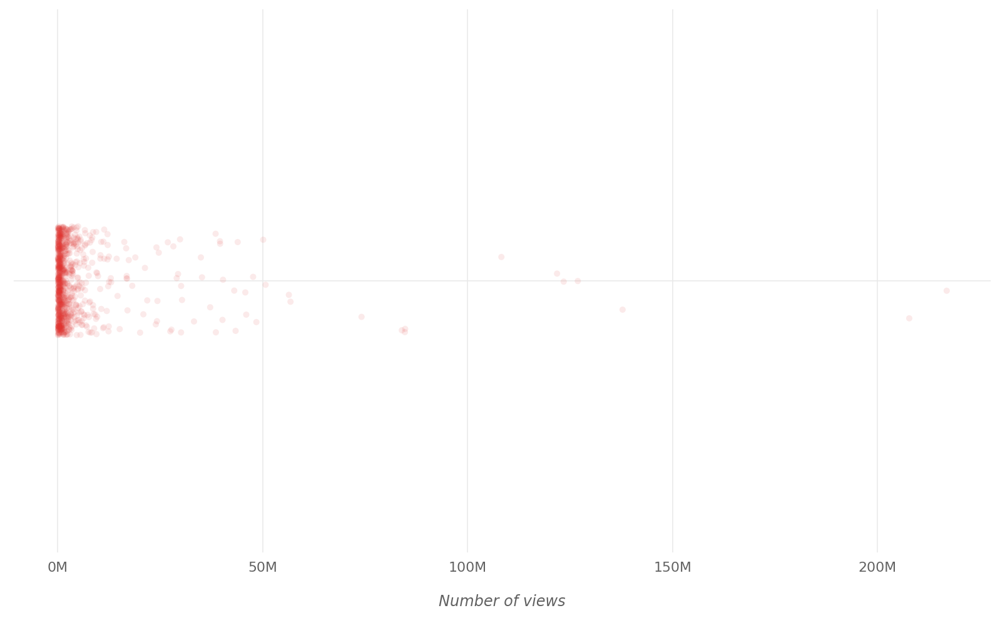

In [13]:
fig, ax = plt.subplots(figsize=(14,8))
sns.stripplot(df1['view_count'], alpha=0.1, color=THEME_COL, ax=ax);
plot_conf(ax, xlbl='Number of views', ticklbl_size=11, lbl_size=12)
formatter = ticker.FuncFormatter(func=lambda x,y: '{:.0f}M'.format(x/1e6))
ax.xaxis.set_major_formatter(formatter)

# I. Titles

#### 1. Percentage of full-uppercase titles

In [14]:
uptitlepercent=df1.drop_duplicates(subset=['video_id'])['title'].apply(str.isupper).sum() / \
    df1.drop_duplicates(subset=['video_id']).shape[0] * 100
print("{:.2f}".format(uptitlepercent), "% from all videos have full-uppercase titles.")

5.87 % from all videos have full-uppercase titles.


Detail of full-uppercase words in titles

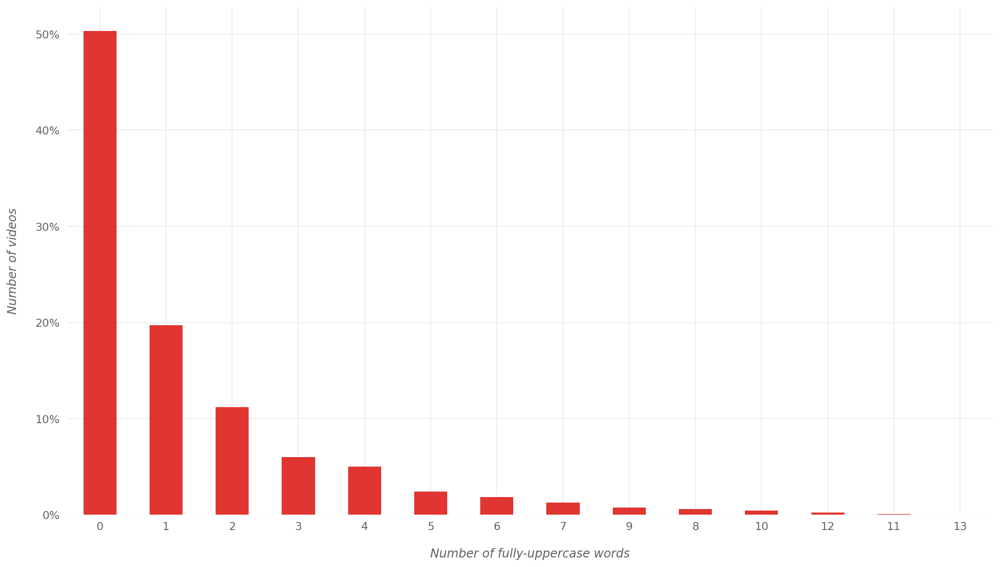

In [15]:
upper_counts = []
for t in df['title'].values:
    t = re.sub(r'[^\w]', ' ', t)
    t = t.split()
    c = 0
    for w in t:
        if w.isalpha() and w.isupper():
            c += 1
    upper_counts.append(c)


ax = (pd.Series(upper_counts).value_counts(normalize=True) * 100).plot(
    kind='bar', figsize=(14,8), rot=0, color=THEME_COL)
plot_conf(ax, xlbl='Number of fully-uppercase words', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}%'))
plt.tight_layout()

In [16]:
titlecase_count = 0
for t in df1['title'].values:
    t = re.sub(r'[^\w]', ' ', t)
    t = t.split()
    word_count = len(t) 
    c = 0
    for w in t:
        if w[0].isalpha() and w[0].isupper():
            c += 1
    if c >= 0.7 * word_count:
        titlecase_count += 1
print('{} titles out of {} titles are title-cased'.format(titlecase_count, df.shape[0]))

592 titles out of 96506 titles are title-cased


#### 2. Most common words in video titles

In [17]:
# source: https://stackoverflow.com/questions/19790188/expanding-english-language-contractions-in-python
contractions = { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"I'd": "I had / I would",
"I'd've": "I would have",
"I'll": "I shall / I will",
"I'll've": "I shall have / I will have",
"I'm": "I am",
"I've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

nltk_download('stopwords')

# if a contraction has more than one possible expanded forms, we replace it 
# with a list of these possible forms
tmp = {}
for k,v in contractions.items():
    if "/" in v:
        tmp[k] = [x.strip() for x in v.split(sep="/")]
    else:
        tmp[k] = v
contractions = tmp

tokenizer = RegexpTokenizer(r"[\w']+")

all_titles = ' '.join([x.lower() for x in df['title']])
for k,v in contractions.items():
    if isinstance(v, list):
        v = random.choice(v)
    all_titles = all_titles.replace(k.lower(), v.lower())
    
words = list(tokenizer.tokenize(all_titles))
words_excl_stopwords = [x for x in words if x not in stopwords.words('english')]

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/tuna_oezdemir/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


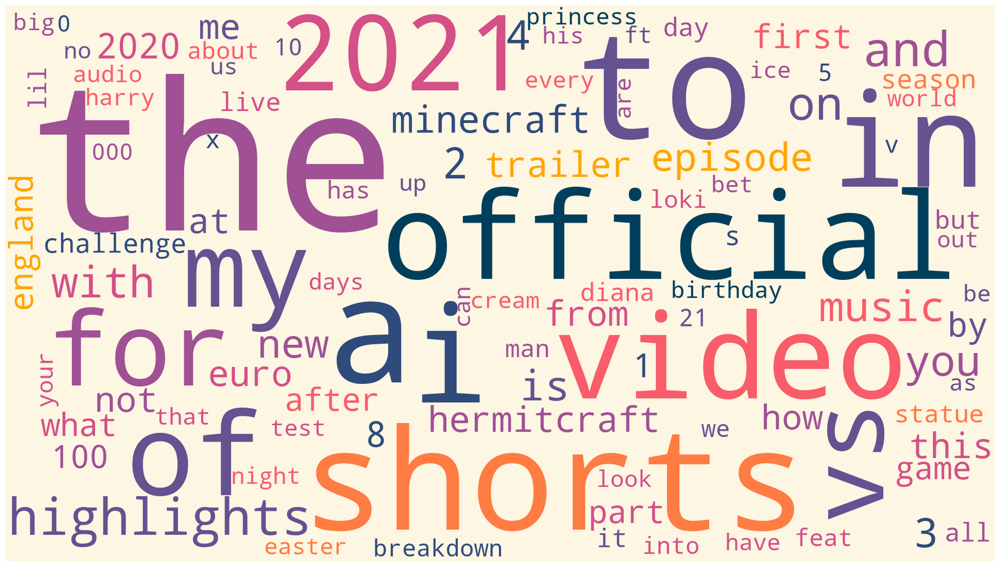

In [18]:
#with stopwords
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ["#003f5c", "#2f4b7c", "#665191", "#a05195", "#d45087", "#f95d6a", "#ff7c43", "#ffa600"]
    return colors[len(word)%len(colors)]

wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, 
                         background_color="#fdf6e3", color_func=col_func, 
                         max_words=100,random_state=7, max_font_size=WC_MAX_FZ, 
                         relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter(words)))

fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)



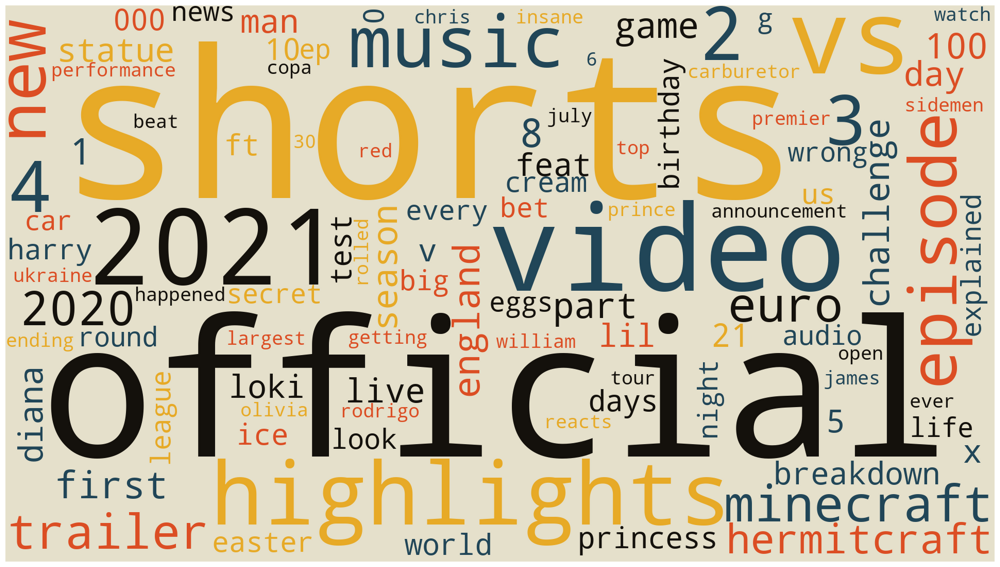

In [19]:
#exclude stopwords
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ["#14110c", "#214658", "#e7aa27", "#dc4e24"]
    return colors[len(word)%len(colors)]

wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, 
                         background_color="#e5e0cb", color_func=col_func, 
                         max_words=100,random_state=1, max_font_size=WC_MAX_FZ, 
                         relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter(words_excl_stopwords)))

fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)

In [20]:
# a list with exact values
for w, c in Counter(words).most_common(35):
    print(w.ljust(10), c)

the        23276
to         10504
a          10395
shorts     9324
i          8414
in         7893
official   7875
video      7525
of         7061
my         6019
2021       5875
vs         5613
for        5586
highlights 5539
and        4973
on         4595
with       4007
2          3962
you        3799
is         3727
music      3707
4          3586
3          3476
new        3268
episode    3058
minecraft  2823
2020       2590
trailer    2581
euro       2566
hermitcraft 2546
not        2466
me         2459
this       2446
at         2437
from       2406


#### 3. Most common symbols in video titles

In [21]:
title_symbols = re.sub(r'\w', '', all_titles)
title_symbols = re.sub(r'\s', '', title_symbols)
title_symbols = list(title_symbols)
Counter(title_symbols).most_common(10)

[('-', 29016),
 ('|', 27609),
 ('!', 24401),
 ('.', 21159),
 ('(', 15612),
 (')', 15612),
 (':', 13375),
 ('#', 11792),
 (',', 10638),
 ("'", 10371)]

#### 4. Most common emojis in video titles

In [22]:
title_emojis = [x for x in title_symbols if x in emoji.UNICODE_EMOJI['en']]
Counter(title_emojis).most_common(10)

[('😂', 1491),
 ('😱', 1310),
 ('👀', 647),
 ('🚨', 508),
 ('😳', 499),
 ('🤔', 388),
 ('🏝', 374),
 ('🔴', 291),
 ('💸', 290),
 ('🔥', 289)]

#### 5. Most common bigrams in video titles

In [23]:
tokenizer = RegexpTokenizer(r"[\w']+")
ng2 = [ngrams(tokenizer.tokenize(t.lower()), n=2) for t in df1['title']]
# flatenning the list
ng2 = [x for y in ng2 for x in y]

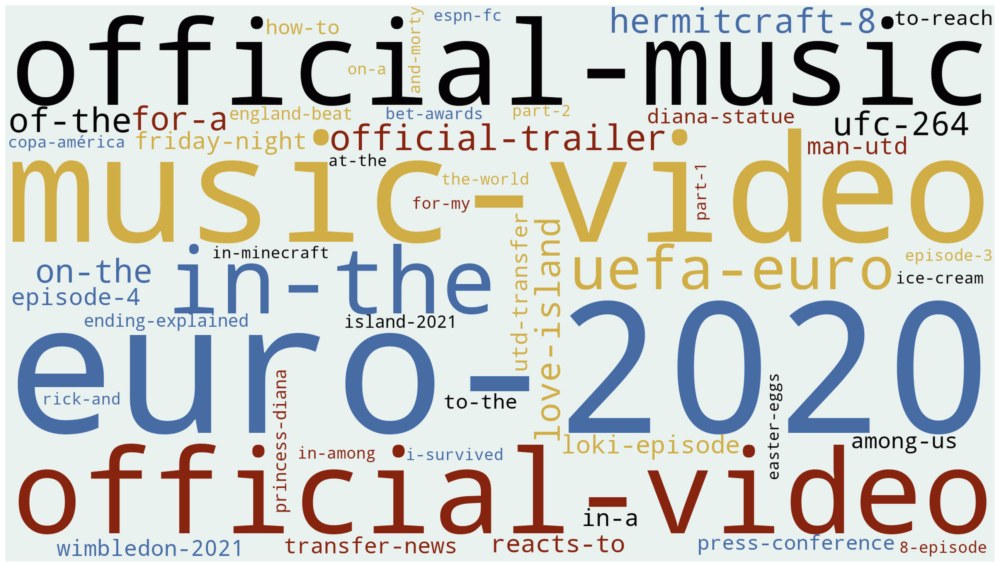

In [24]:
col_ind = -1
def col_func(word, font_size, position, orientation, font_path, random_state):
    global col_ind
    colors = ["#466ca6", "#d1ae45", "#87240e", "#040204"]
    col_ind += 1
    if col_ind == len(colors): col_ind=0 
    return colors[col_ind]

wc = wordcloud.WordCloud(width=1920, height=1080, 
                         collocations=False, background_color="#eaf2f0", 
                         color_func=col_func, max_words=50,
                         normalize_plurals=False,
                         regexp=r".+", 
                         random_state=11, max_font_size=WC_MAX_FZ, 
                         relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter([x + '-' + y for x,y in ng2])))

fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)

In [25]:
pprint(Counter(ng2).most_common(25), compact=False)

[(('euro', '2020'), 42),
 (('music', 'video'), 29),
 (('official', 'video'), 21),
 (('official', 'music'), 21),
 (('in', 'the'), 12),
 (('uefa', 'euro'), 12),
 (('official', 'trailer'), 11),
 (('of', 'the'), 10),
 (('hermitcraft', '8'), 10),
 (('love', 'island'), 10),
 (('for', 'a'), 9),
 (('ufc', '264'), 9),
 (('on', 'the'), 9),
 (('loki', 'episode'), 9),
 (('reacts', 'to'), 9),
 (('in', 'a'), 8),
 (('episode', '4'), 8),
 (('friday', 'night'), 8),
 (('man', 'utd'), 8),
 (('among', 'us'), 7),
 (('wimbledon', '2021'), 7),
 (('utd', 'transfer'), 7),
 (('transfer', 'news'), 7),
 (('to', 'the'), 6),
 (('press', 'conference'), 6)]


#### 6. Are hashtags used in video titles?

In [26]:
title_contains_hashtag = df1['title'].apply(lambda x: True if re.search(r'\B\#\w+?\b', str(x)) else False)

In [27]:
title_hastag=title_contains_hashtag.sum() / df1.shape[0] * 100
print("{:.2f}".format(title_hastag), "% titles are containing hastags.")

11.53 % titles are containing hastags.


#### 7. Best title length

/home/tuna_oezdemir/myvenv/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


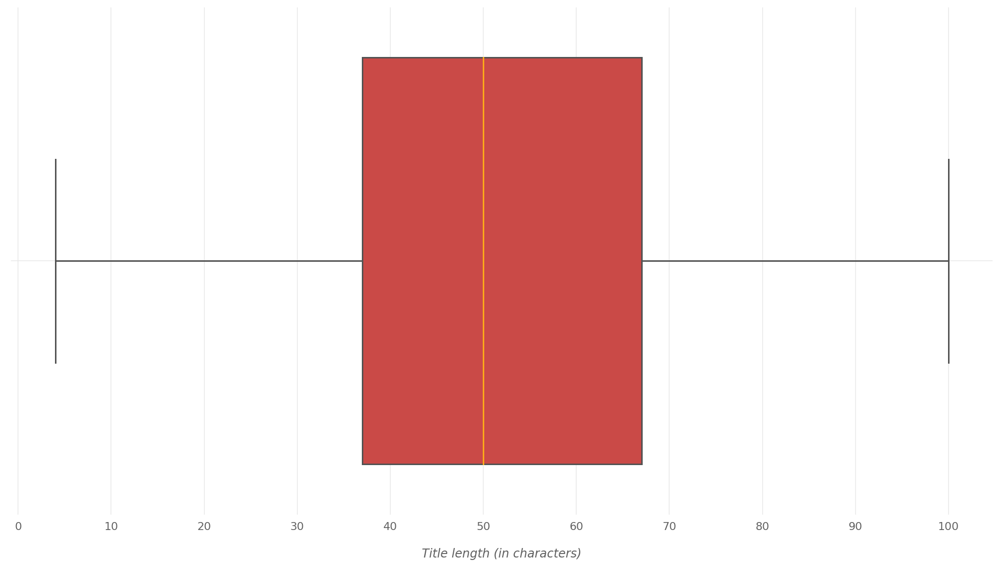

In [28]:
title_lengths = df1["title"].apply(lambda x: len(x))
fig, ax = plt.subplots(figsize=(14,8))
sns.boxplot(title_lengths, color=THEME_COL, medianprops={'color': '#FBA91A'}, ax=ax)
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
plot_conf(ax, xlbl='Title length (in characters)', ticklbl_size=11, lbl_size=12)
plt.tight_layout()

In [29]:
title_lengths.describe()

count    937.000000
mean      52.892209
std       21.592380
min        4.000000
25%       37.000000
50%       50.000000
75%       67.000000
max      100.000000
Name: title, dtype: float64

In [30]:
df1[title_lengths == 4] 

,video_id,title,publishedAt,channelId,channelTitle,categoryId,trending_date,tags,view_count,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,description,category_name,country
17972,ZiMyyWXHBhw,Deji,2021-06-16 13:18:35,UCGmnsW623G1r-Chmo5RB4Yw,JJ Olatunji,24,21.08.07,ksi|ksiolajidebt|ksiolajidebthd,8496641,980843,7021,57941,https://i.ytimg.com/vi/ZiMyyWXHBhw/default.jpg,False,False,PRE ORDER MY ALBUM HERE: https://ksi.lnk.to/AllOverThePlace MY SHOP: https://shopksi.com/ Stream KSI’s “Holiday” - https://Ksi.lnk.to/HolidayyvWatch more from All Over The Place: https://www.youtube.com/playlist?list=PLr2SXwjSsDgK-q3zBX0ze0DtBnXopu8GE,Entertainment,IE


In [31]:
df1[title_lengths < 20].shape[0]

37

# II. Categories

/home/tuna_oezdemir/myvenv/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


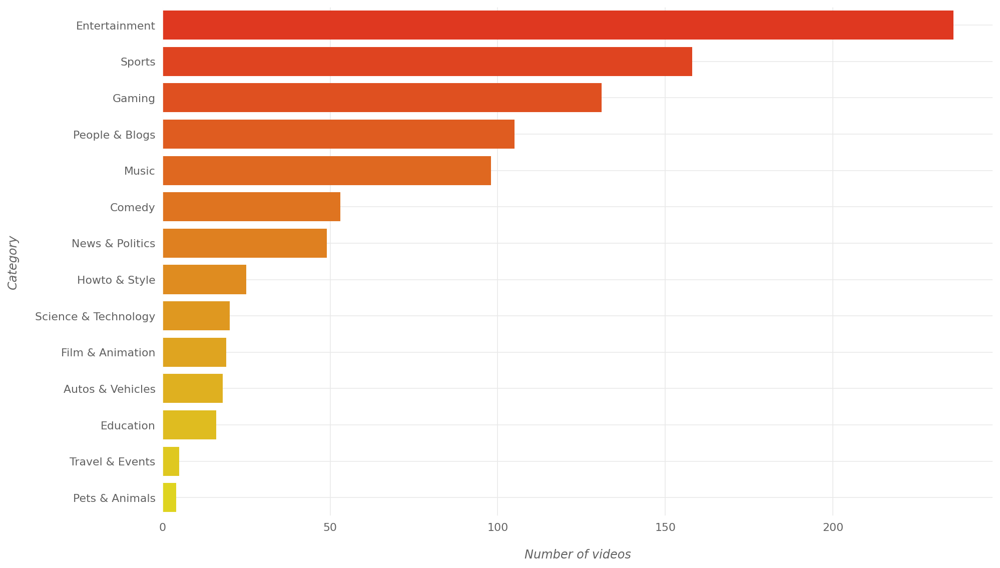

In [32]:
fig, ax = plt.subplots(figsize=(14,8))
tdf = df1['category_name'].value_counts(sort=True, ascending=False)
sns.barplot(tdf.values, tdf.index.values, hue=tdf.values, orient='h', 
            palette=reversed(sns.color_palette('autumn', n_colors=15)[:]), 
            dodge=False, ax=ax)
ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plot_conf(ax, xlbl='Number of videos', ylbl='Category', ticklbl_size=11, lbl_size=12)
ax.get_legend().remove()
plt.tight_layout()

In [33]:
tdf

Entertainment           236
Sports                  158
Gaming                  131
People & Blogs          105
Music                    98
Comedy                   53
News & Politics          49
Howto & Style            25
Science & Technology     20
Film & Animation         19
Autos & Vehicles         18
Education                16
Travel & Events           5
Pets & Animals            4
Name: category_name, dtype: int64

#### 8. Percentage trending per categories

In [34]:
100 * tdf / len(df1)

Entertainment           25.186766
Sports                  16.862327
Gaming                  13.980790
People & Blogs          11.205977
Music                   10.458911
Comedy                   5.656350
News & Politics          5.229456
Howto & Style            2.668090
Science & Technology     2.134472
Film & Animation         2.027748
Autos & Vehicles         1.921025
Education                1.707577
Travel & Events          0.533618
Pets & Animals           0.426894
Name: category_name, dtype: float64

# III. Publish Day

#### 9. Most Popular Publishing Day for Trending Videos

In [35]:
tmp_publishedAt = df1['publishedAt'].copy()
df1['publishedAt'] = pd.to_datetime(df1['publishedAt'])

In [36]:
df1["publishing_day"] = df1["publishedAt"].dt.day_name()
df1["publishing_hour"] = df1["publishedAt"].dt.hour

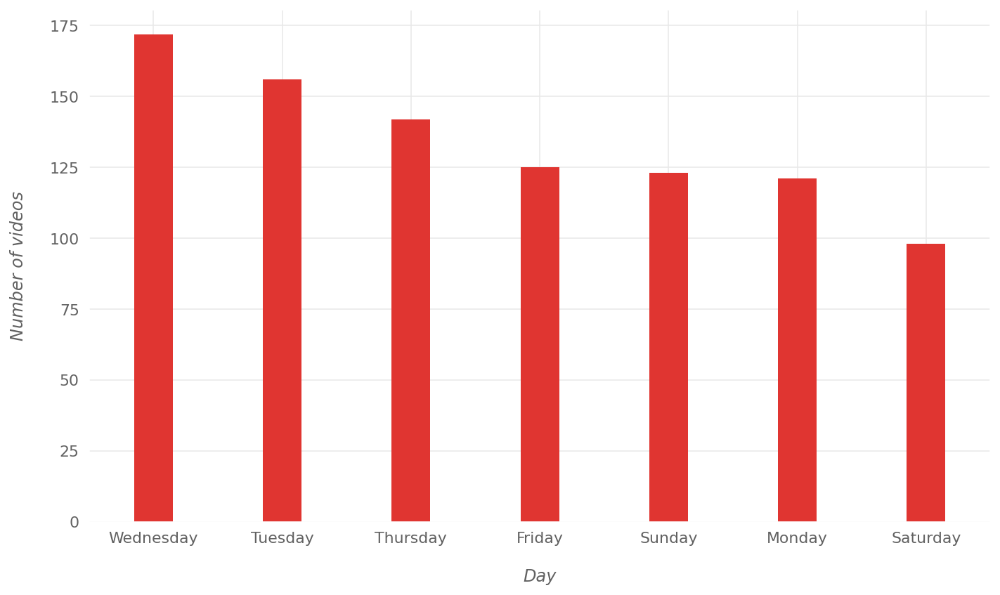

In [37]:
ax = df1['publishing_day'].value_counts().plot(
    kind='bar', figsize=(10,6), rot=0, color=THEME_COL)

ax.yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))

plot_conf(ax, xlbl='Day', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
change_width(ax, .3)
plt.tight_layout()

# IV. Channels

#### 10. Most Popular Channel for Trending Videos

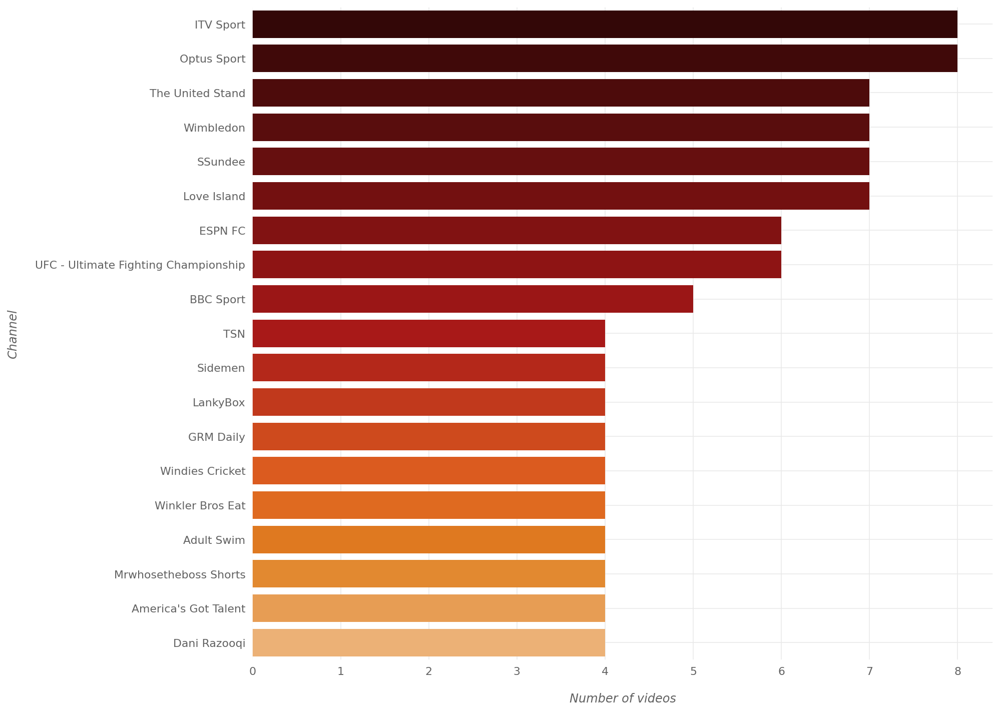

In [38]:
tdf = df1.groupby("channelTitle").size().reset_index(name="video_count") \
    .sort_values("video_count", ascending=False).head(19)
fig, ax = plt.subplots(figsize=(14,10))
sns.barplot(x="video_count", y="channelTitle", data=tdf,
            palette=sns.color_palette('gist_heat', n_colors=25)[3:], ax=ax);
plot_conf(ax, xlbl='Number of videos', ylbl='Channel', ticklbl_size=11, lbl_size=12)
plt.tight_layout()

# V. Comments

#### 11. Comment count distribution

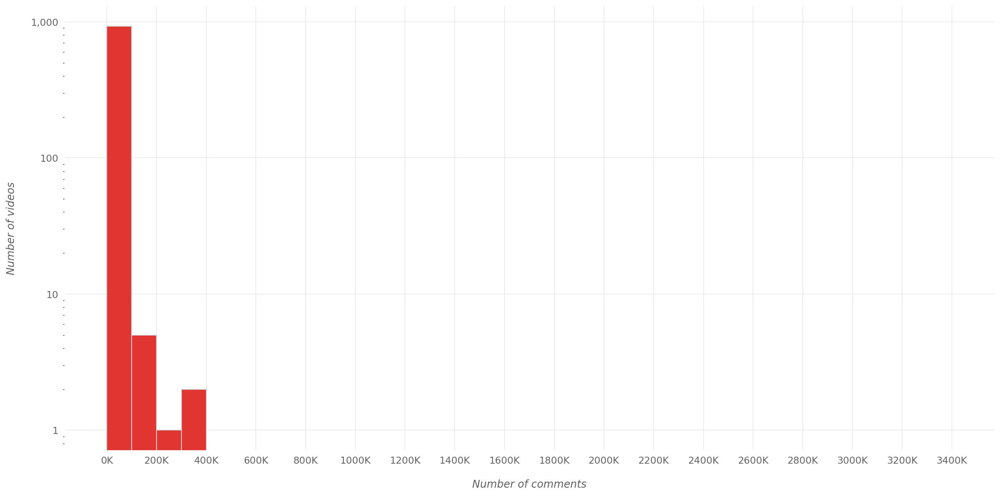

In [39]:
ax = df1['comment_count'].plot(kind='hist', bins=np.arange(0, 3.5e6, 1e5)-0.5, figsize=(16,8), 
                           logy=True, lw=1, ec='lightgray', color=THEME_COL);
plot_conf(ax, xlbl='Number of comments', ylbl='Number of videos', ticklbl_size=11, lbl_size=12)
formatter = ticker.FuncFormatter(func=lambda x,y: '{:.0f}K'.format(x/1e3))
ax.xaxis.set_major_locator(ticker.MultipleLocator(200000))
ax.xaxis.set_major_formatter(ticker.FuncFormatter(formatter));
ax.yaxis.set_major_formatter(ticker.StrMethodFormatter(fmt='{x:,.0f}'))
plt.tight_layout()

In [40]:
df1[df1['comment_count'] < 100_000].shape[0] / df1.shape[0] * 100

99.1462113127001

In [41]:
df1['comment_count'].quantile(q=0.9)

16313.79999999999

# VI. Descriptions

#### 12. Distribution of description lengths

/home/tuna_oezdemir/myvenv/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


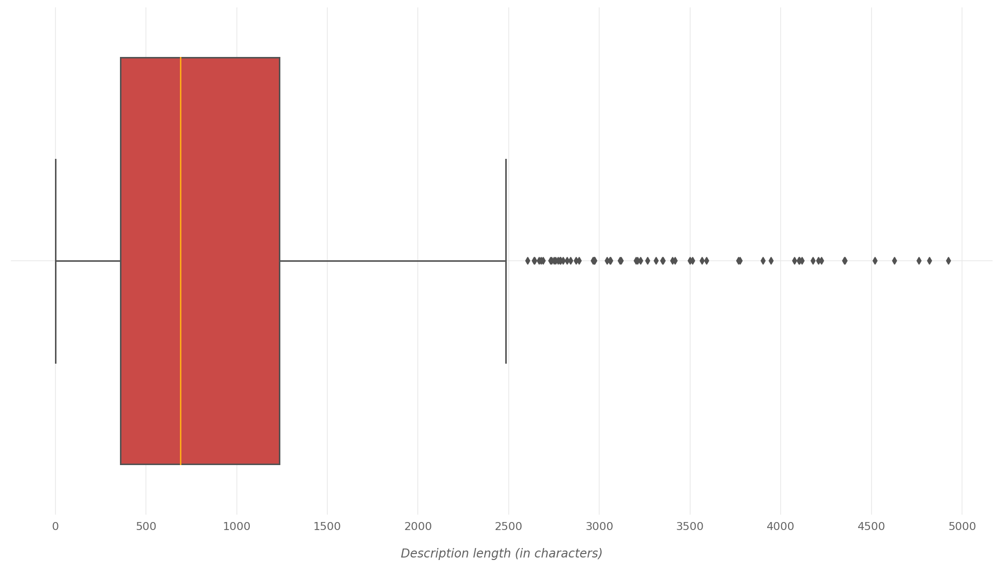

In [44]:
desc_lengths = df1["description"].apply(lambda x: 0 if pd.isnull(x) else len(x))
fig, ax = plt.subplots(figsize=(14,8))
sns.boxplot(desc_lengths, color=THEME_COL, medianprops={'color': '#FBA91A'}, ax=ax)
plot_conf(ax, xlbl='Description length (in characters)', ticklbl_size=11, lbl_size=12)
ax.xaxis.set_major_locator(ticker.MultipleLocator(500))
plt.tight_layout()

In [45]:
desc_lengths.describe()

count     937.000000
mean      932.898613
std       859.163887
min         0.000000
25%       360.000000
50%       690.000000
75%      1234.000000
max      4925.000000
Name: description, dtype: float64

In [46]:
desc_lengths[desc_lengths == 0].shape[0]

35

In [74]:
#depend on the mean
desc_len = desc_lengths[desc_lengths > 933].shape[0] / df1.shape[0] * 100
print("{:.2f}".format(desc_len), "% videos have average description words.")

35.54 % videos have average description words.


#### 13. Most common words in descriptions

In [48]:
all_descs = ' '.join([x.lower() for x in df1['description'] if not pd.isnull(x)])
for k,v in contractions.items():
    if isinstance(v, list):
        v = random.choice(v)
    all_descs = all_descs.replace(k.lower(), v.lower())
    
desc_words = list(tokenizer.tokenize(all_descs))
desc_words = [x for x in desc_words if x not in stopwords.words('english')]

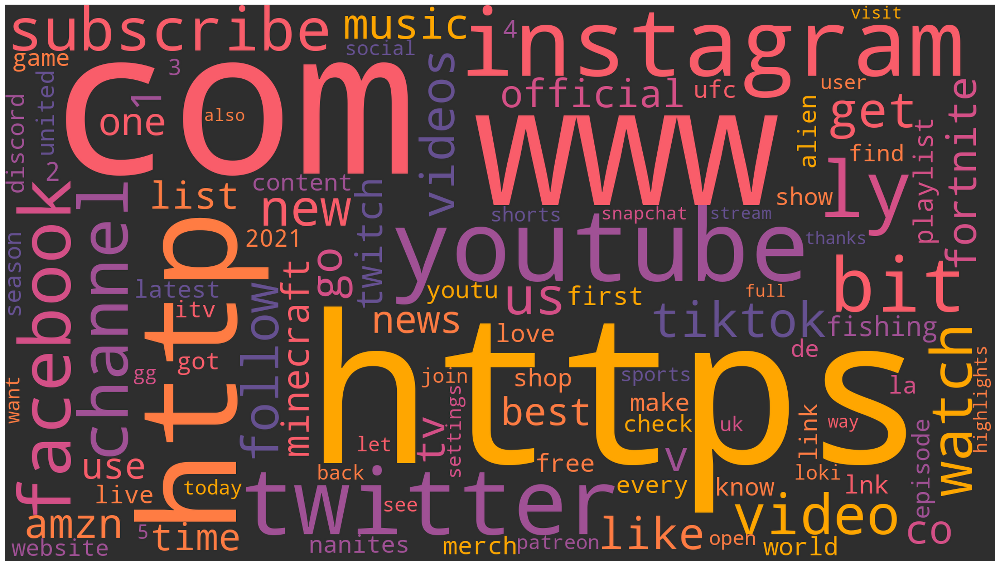

In [49]:
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ["#665191", "#a05195", "#d45087", "#f95d6a", "#ff7c43", "#ffa600"]
    return colors[len(word)%len(colors)]

wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, 
                         background_color="#2e2e2e", color_func=col_func, 
                         max_words=100,random_state=1, max_font_size=WC_MAX_FZ, 
                         relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter(desc_words)))

fig, ax = plt.subplots(figsize=(19.2,10.8))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)

In [50]:
# a list with exact values
for w, c in Counter(desc_words).most_common(15):
    print(w.ljust(10), c)

https      4253
com        4170
www        2677
http       1624
youtube    1266
instagram  1132
twitter    1087
ly         775
bit        710
facebook   632
channel    576
subscribe  442
watch      407
video      387
us         338


#### 14. Most common 2-grams in descriptions

In [51]:
desc_2_tokenizer = RegexpTokenizer(r"[\w']+")
desc_ng2 = [ngrams(desc_2_tokenizer.tokenize(d.lower()), n=2) for d in df1['description'] if not pd.isnull(d)]
desc_ng2 = [x for y in desc_ng2 for x in y]

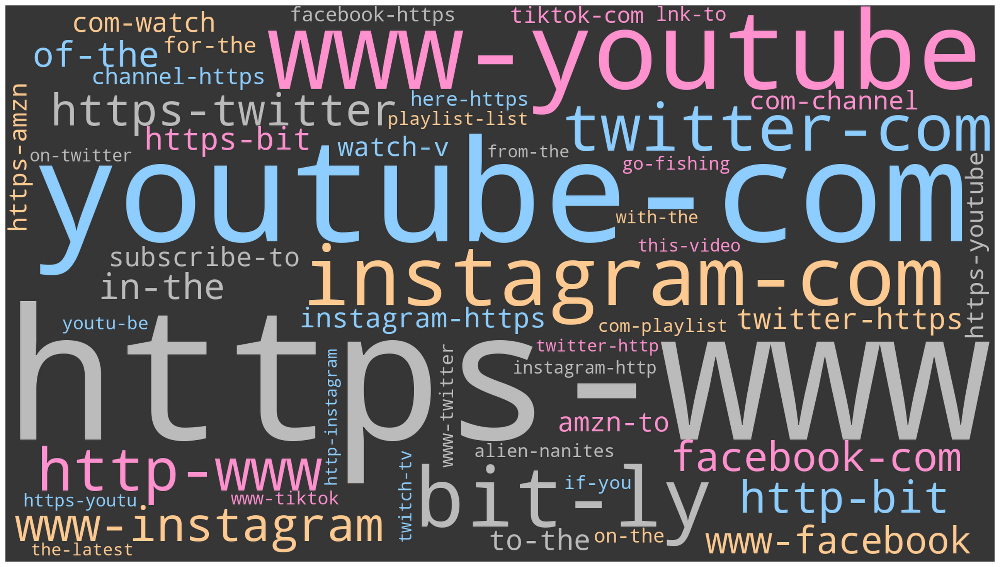

In [52]:
col_ind = -1
def col_func(word, font_size, position, orientation, font_path, random_state):
    global col_ind
    colors = ["#BBBBBB", "#8DCDFF", "#FF91CE", "#FFCA91"]
    col_ind += 1
    if col_ind == len(colors): col_ind=0 
    return colors[col_ind]

wc = wordcloud.WordCloud(width=1920, height=1080, 
                         collocations=False, background_color="#363636", 
                         color_func=col_func, max_words=50,
                         normalize_plurals=False,
                         regexp=r".+", 
                         random_state=11, max_font_size=WC_MAX_FZ, 
                         relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter([x + '-' + y for x,y in desc_ng2])))

fig, ax = plt.subplots(figsize=(20,10))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)

In [53]:
Counter([x + '-' + y for x,y in desc_ng2]).most_common(15)

[('https-www', 1836),
 ('youtube-com', 1016),
 ('www-youtube', 822),
 ('instagram-com', 703),
 ('bit-ly', 700),
 ('twitter-com', 676),
 ('http-www', 547),
 ('www-instagram', 504),
 ('https-twitter', 435),
 ('http-bit', 423),
 ('facebook-com', 380),
 ('www-facebook', 317),
 ('in-the', 288),
 ('of-the', 280),
 ('https-bit', 268)]

#### 15. Are hashtags used in video descriptions?

In [54]:
desc_contains_hashtag = df1['description'].apply(lambda x: True if re.search(r'\B\#\w+?\b', str(x)) else False)

In [55]:
desc_hastag = desc_contains_hashtag.sum() / df1.shape[0] * 100
print("{:.2f}".format(desc_hastag), "% videos using hastag.")

45.68 % videos using hastag.


In [56]:
desc_hashtag_counts = df1['description'].apply(lambda x: len(re.findall(r'\B\#\w+?\b', str(x))))
desc_hashtag_counts = desc_hashtag_counts[desc_hashtag_counts != 0]

/home/tuna_oezdemir/myvenv/lib/python3.6/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


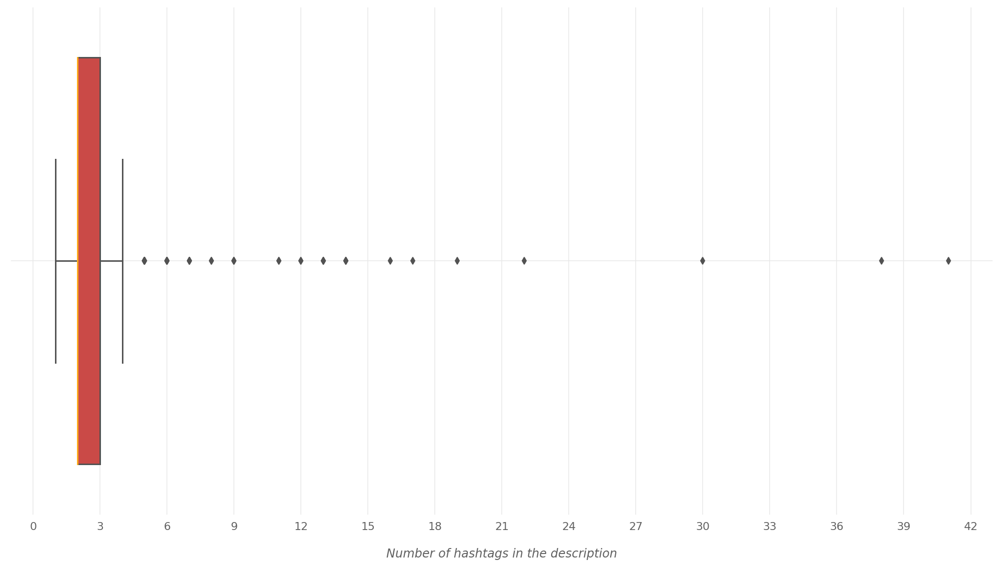

In [57]:
fig, ax = plt.subplots(figsize=(14,8))
sns.boxplot(desc_hashtag_counts, color=THEME_COL, medianprops={'color': '#FBA91A'}, ax=ax)
ax.xaxis.set_major_locator(ticker.MultipleLocator(3))
plot_conf(ax, xlbl='Number of hashtags in the description', ticklbl_size=11, lbl_size=12)
plt.tight_layout()

In [58]:
desc_hashtag_counts.describe()

count    428.000000
mean       3.102804
std        3.902043
min        1.000000
25%        2.000000
50%        2.000000
75%        3.000000
max       41.000000
Name: description, dtype: float64

#### 16. Distribution of the number and length of tags

In [59]:
df1['num_tags'] = df1['tags'].apply(lambda x: len(x.split('|')) if x != '[none]' else 0)
df1['tags_length'] = df1['tags'].apply(lambda x: len(x.replace('|', '')) if x != '[none]' else 0)

In [60]:
df1['num_tags'].describe()

count    937.000000
mean      15.320171
std       12.381574
min        0.000000
25%        4.000000
50%       14.000000
75%       24.000000
max       68.000000
Name: num_tags, dtype: float64

In [61]:
#depends on mean of number tags
tagspercentage=100 * df1[df1['num_tags'] >= 15].shape[0] / df1.shape[0]
print("{:.2f}".format(tagspercentage), "% videos using more than average number of tags.")

49.73 % videos using more than average number of tags.


In [62]:
df1['tags_length'].describe()

count    937.000000
mean     191.122732
std      158.912379
min        0.000000
25%       36.000000
50%      168.000000
75%      359.000000
max      450.000000
Name: tags_length, dtype: float64

In [75]:
#depends on mean of tags
tagspercentage=100 * df1[df1['tags_length'] >= 191].shape[0] / df1.shape[0]
print("{:.2f}".format(tagspercentage), "% videos using more than average length of tags.")

46.96 % videos using more than average length of tags.


#### 17. Most common words in tags

In [64]:
all_tags = ' '.join([x.lower() for x in df1['tags'].apply(
    lambda x: x if pd.isnull(x) else ' '.join(x.split('|'))) if x != '[none]'])
for k,v in contractions.items():
    if isinstance(v, list):
        v = random.choice(v)
    all_tags = all_tags.replace(k.lower(), v.lower())
    
tags_words = list(tokenizer.tokenize(all_tags))
tags_words = [x for x in tags_words if x not in stopwords.words('english')]

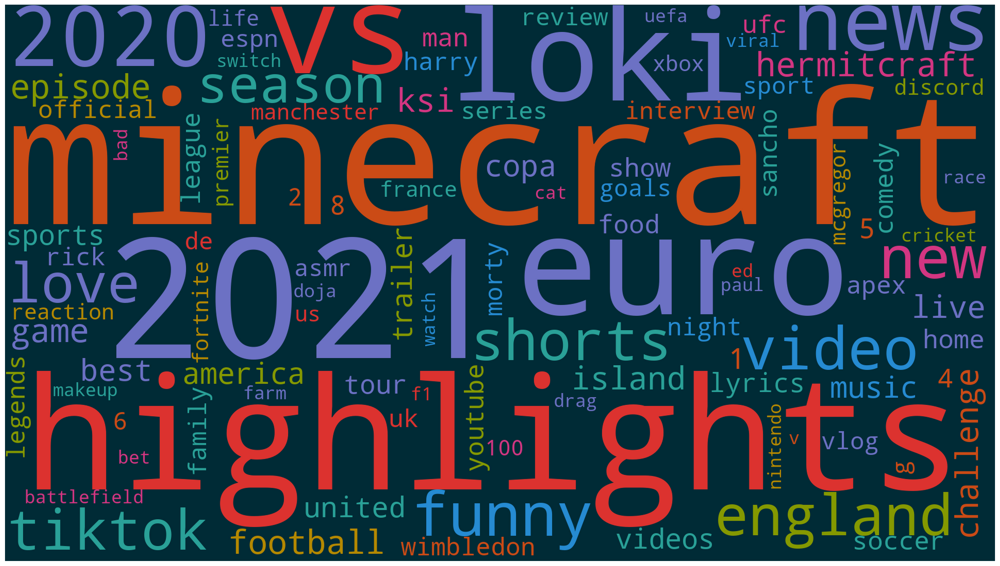

In [65]:
def col_func(word, font_size, position, orientation, font_path, random_state):
    colors = ['#b58900', '#cb4b16', '#dc322f', '#d33682', '#6c71c4', 
              '#268bd2', '#2aa198', '#859900']
    return colors[len(word)%len(colors)] 

wc = wordcloud.WordCloud(width=1920, height=1080, collocations=False, prefer_horizontal=0.9,
                         background_color="#002b36", color_func=col_func, max_font_size=WC_MAX_FZ, 
                         max_words=100, random_state=7, relative_scaling=WC_RS
                        ).generate_from_frequencies(dict(Counter(tags_words)))

fig, ax = plt.subplots(figsize=(19.2,10.8))
ax.imshow(wc, interpolation='lanczos')
ax.axis("off")
plt.tight_layout(pad=0)

In [66]:
# a list with exact values
for w, c in Counter(tags_words).most_common(15):
    print(w.ljust(10), c)

minecraft  323
2021       266
highlights 232
euro       182
loki       173
vs         169
2020       162
news       157
funny      144
video      139
new        139
england    126
shorts     124
tiktok     121
love       119


#### 18. Are hashtags used in video tags?

In [70]:
tags_contains_hashtag = df1['tags'].apply(lambda x: True if re.search(r'\B\#\w+?\b', str(x)) else False)

In [71]:
containtags=tags_contains_hashtag.sum() / df1.shape[0] * 100
print("{:.2f}".format(containtags), "% videos used hastags.")

3.42 % videos used hastags.


# VIII. All

#### 19. Correlations of Trending Videos

In [72]:
df1['title_length'] = df1['title'].str.len()
df1['desc_length'] = df1['description'].str.len()

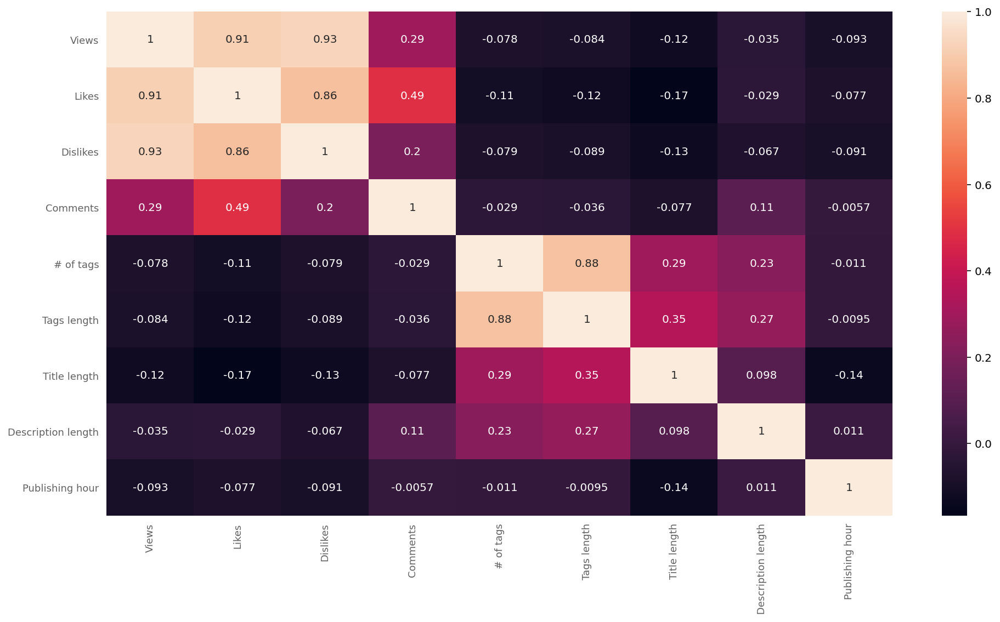

In [73]:
heatmap_columns = ['view_count', 'likes', 'dislikes', 'comment_count', 'num_tags',
                   'tags_length', 'title_length', 'desc_length', 'publishing_hour']

h_labels = ['Views', 'Likes', 'Dislikes', 'Comments', '# of tags', 'Tags length', 
            'Title length', 'Description length', 'Publishing hour']

fig, ax = plt.subplots(figsize=(14,8))
sns.heatmap(df1[heatmap_columns].corr(), annot=True, xticklabels=h_labels, yticklabels=h_labels)
plot_conf(ax)
plt.tight_layout()